<a href="https://colab.research.google.com/github/sergioGarcia91/ML_Carolina_Bays/blob/main/16a_U_Net_Predictions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Start

In [ ]:
!pip install tables

In [ ]:
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import h5py
import multiprocessing
import joblib

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset

# Verificar si CUDA (GPU) está disponible
if torch.cuda.is_available():
    print(f"GPU disponible: {torch.cuda.get_device_name(0)}")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
else:
    print("GPU no disponible, usando CPU.")

GPU disponible: Tesla T4


In [ ]:
pathSaveFiguras = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/Manuscrito_FC/Figuras_Manuscrito/'

In [ ]:
device

device(type='cuda')

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Change Font of the Figures

In [ ]:
!wget https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf

--2025-11-11 18:41:56--  https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/justrajdeep/fonts/master/Times%20New%20Roman.ttf [following]
--2025-11-11 18:41:56--  https://raw.githubusercontent.com/justrajdeep/fonts/master/Times%20New%20Roman.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 834452 (815K) [application/octet-stream]
Saving to: ‘Times New Roman.ttf’

Times New Roman.ttf 100%[===================>] 814.89K  --.-KB/s    in 0.04s   

2025-11-11 18:41:57 (21.8 MB/s) - ‘Times New Roman.ttf’ saved [834452/834452]



In [ ]:
import matplotlib.font_manager as fm

In [ ]:
# Path to the custom font
font_path = 'Times New Roman.ttf'

# Add the font to the Matplotlib font manager
font_prop = fm.FontProperties(fname=font_path)
fm.fontManager.addfont(font_path)

# Get the font name to use in rcParams
font_name = font_prop.get_name()
font_name

'Times New Roman'

In [ ]:
plt.rcParams['font.family'] = font_name

# Funtions

## get_rgb

In [ ]:
def get_rgb(tif):
  rgb_image = np.dstack((tif[3],
                         tif[2],
                         tif[1]))
  return rgb_image


## normalize

In [ ]:
def normalize(img, min_percent=5, max_percent=95):
  # Adjusts the image contrast using percentiles.
  p_min, p_max = np.percentile(img, (min_percent, max_percent))
  return np.clip((img - p_min) / (p_max - p_min), 0, 1)


## U-Net model

In [ ]:
def normalized_index(B1, B2):
  x = (B2 - B1) / (B2 + B1)
  x = np.nan_to_num(x, nan=0.0, posinf= 1.0)
  x = (x + 1 ) / 2
  x = np.expand_dims(x, axis=1)
  return x


https://pyimagesearch.com/2021/11/08/u-net-training-image-segmentation-models-in-pytorch/

In [ ]:
# import the necessary packages
#from . import config
from torch.nn import ConvTranspose2d
from torch.nn import Conv2d
from torch.nn import MaxPool2d
from torch.nn import Module
from torch.nn import ModuleList
from torch.nn import ReLU
from torchvision.transforms import CenterCrop
from torch.nn import functional as F
import torch

In [ ]:
class Block(Module):
	def __init__(self, inChannels, outChannels):
		super().__init__()
		# store the convolution and RELU layers
		self.conv1 = Conv2d(inChannels, outChannels, kernel_size=3, padding=1)
		self.relu = ReLU()
		self.conv2 = Conv2d(outChannels, outChannels, kernel_size=3, padding=1)
	def forward(self, x):
		# apply CONV => RELU => CONV block to the inputs and return it
		return self.conv2(self.relu(self.conv1(x)))

In [ ]:
class Encoder(Module):
	def __init__(self, channels=(7, 16, 32, 64)):
		super().__init__()
		# store the encoder blocks and maxpooling layer
		self.encBlocks = ModuleList(
			[Block(channels[i], channels[i + 1])
			 	for i in range(len(channels) - 1)])
		self.pool = MaxPool2d(2)
	def forward(self, x):
		# initialize an empty list to store the intermediate outputs
		blockOutputs = []
		# loop through the encoder blocks
		for block in self.encBlocks:
			# pass the inputs through the current encoder block, store
			# the outputs, and then apply maxpooling on the output
			x = block(x)
			blockOutputs.append(x)
			x = self.pool(x)
		# return the list containing the intermediate outputs
		return blockOutputs

In [ ]:
class Decoder(Module):
	def __init__(self, channels=(64, 32, 16)):
		super().__init__()
		# initialize the number of channels, upsampler blocks, and
		# decoder blocks
		self.channels = channels
		self.upconvs = ModuleList(
			[ConvTranspose2d(channels[i], channels[i + 1], 2, 2)
			 	for i in range(len(channels) - 1)])
		self.dec_blocks = ModuleList(
			[Block(channels[i], channels[i + 1])
			 	for i in range(len(channels) - 1)])
	def forward(self, x, encFeatures):
		# loop through the number of channels
		for i in range(len(self.channels) - 1):
			# pass the inputs through the upsampler blocks
			x = self.upconvs[i](x)
			# crop the current features from the encoder blocks,
			# concatenate them with the current upsampled features,
			# and pass the concatenated output through the current
			# decoder block
			encFeat = self.crop(encFeatures[i], x)
			x = torch.cat([x, encFeat], dim=1)
			x = self.dec_blocks[i](x)
		# return the final decoder output
		return x
	def crop(self, encFeatures, x):
		# grab the dimensions of the inputs, and crop the encoder
		# features to match the dimensions
		(_, _, H, W) = x.shape
		encFeatures = CenterCrop([H, W])(encFeatures)
		# return the cropped features
		return encFeatures

In [ ]:
class UNet(Module):
  def __init__(self, encChannels=(7, 16, 32, 64),
              decChannels=(64, 32, 16),
              nbClasses=1, retainDim=True,
              #outSize=(config.INPUT_IMAGE_HEIGHT,  config.INPUT_IMAGE_WIDTH)):
              outSize=(64,  64)):
    super().__init__()
    # initialize the encoder and decoder
    self.encoder = Encoder(encChannels)
    self.decoder = Decoder(decChannels)
    # initialize the regression head and store the class variables
    self.head = Conv2d(decChannels[-1], nbClasses, 1)
    self.retainDim = retainDim
    self.outSize = outSize

  def forward(self, x):
    # grab the features from the encoder
    encFeatures = self.encoder(x)
    # pass the encoder features through decoder making sure that
    # their dimensions are suited for concatenation
    decFeatures = self.decoder(encFeatures[::-1][0], encFeatures[::-1][1:])
    # pass the decoder features through the regression head to
    # obtain the segmentation mask
    map = self.head(decFeatures)
    # check to see if we are retaining the original output
    # dimensions and if so, then resize the output to match them
    if self.retainDim:
      map = F.interpolate(map, self.outSize)
    # return the segmentation map

    return map

## Predecir 1 imagen

In [ ]:
def make_predictions(model, image):
  # set model to evaluation mode
  model.eval()
  # turn off gradient tracking
  with torch.no_grad():
    # make the prediction, pass the results through the sigmoid
    # function, and convert the result to a NumPy array
    predMask = model(image).squeeze()
    predMask = torch.sigmoid(predMask)
    predMask = predMask.cpu().numpy()
    # filter out the weak predictions and convert them to integers
    #predMask = (predMask > config.THRESHOLD) * 255
    #predMask = predMask.astype(np.uint8)

  return predMask

# Load data

In [ ]:
path_save_h5 = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/Dataset_h5'

h5_file = os.listdir(path_save_h5)
h5_file

['dataset_AOI_01_32x32.h5',
 'dataset_AOI_02_32x32.h5',
 'dataset_AOI_03_32x32.h5',
 'dataset_AOI_04_32x32.h5',
 'dataset_AOI_02_64x64.h5',
 'dataset_AOI_01_64x64.h5',
 'dataset_AOI_03_64x64.h5',
 'dataset_AOI_04_64x64.h5',
 'dataset_AOI_02_256x256.h5',
 'dataset_AOI_03_256x256.h5',
 'dataset_AOI_04_256x256.h5',
 'dataset_AOI_01_256x256.h5']

In [ ]:
img = 30000 # 99

# AOI
AOI_name = 'AOI_02'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_64x64.h5'), 'r')
AOI_

<HDF5 file "dataset_AOI_02_64x64.h5" (mode r)>

In [ ]:
AOI_[f'{AOI_name}_X'].shape

(94500, 7, 64, 64)

## Plot image

Image 30000


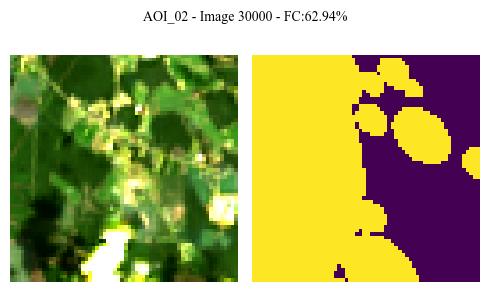

In [ ]:
print(f'Image {img}')
X_ = AOI_[f'{AOI_name}_X'][img]
Y_ = AOI_[f'{AOI_name}_y'][img]
P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]

fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
ax[0].axis('off')
ax[1].imshow(Y_, vmin=0, vmax=1)
ax[1].axis('off')

plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
plt.tight_layout()
plt.show()

# X - y df

In [ ]:
X_1 = AOI_[f'{AOI_name}_X'][img]
y_1 = AOI_[f'{AOI_name}_y'][img]

X_1_r = np.reshape(X_1, (7, -1)).T
y_1_r = y_1.reshape(-1,1)

# 64*64 = 4096
print(X_1_r.shape)
print(y_1_r.shape)

(4096, 7)
(4096, 1)


# Predicting U-Net Model

## Load models

In [ ]:
path_models = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/ML_models/'

models_list = os.listdir(path_models)
models_list = [model for model in models_list if model.endswith('.pth')]
models_list

['model_CNN_CPU_01.pth',
 'model_CNN_GPU_01.pth',
 'model_CNN_GPU_02.pth',
 'model_CNN_GPU_03.pth',
 'model_Unet_7ch_GPU_01.pth',
 'model_Unet_7ch_GPU_01_v2.pth',
 'model_Unet_7ch_GPU_02_v2.pth',
 'model_Unet_7ch_GPU_02.pth',
 'model_Unet_7ch_GPU_03.pth',
 'model_Unet_7ch_GPU_03_v2.pth',
 'model_Unet_7ch_GPU_04_v2.pth',
 'model_Unet_7ch_GPU_04.pth',
 'model_Unet_12ch_GPU_01.pth',
 'model_Unet_v2_7ch_ML_GPU_01.pth',
 'model_Unet_v2_7ch_bandas_GPU_01.pth']

In [ ]:
path_modelo_bandas = os.path.join(path_models, 'model_Unet_7ch_GPU_04.pth')

# Inicializar el modelo y aplicar la inicialización personalizada
model_bandas = UNet().to(device) # mover a GPU
model_bandas.load_state_dict(torch.load(path_modelo_bandas))
# Si se usa GPU
#model.load_state_dict(torch.load('modelo_pesos.pth', map_location=torch.device('cuda')))
#model.eval()  # si es para inferencia -- > ya esta en la fun predecir

<All keys matched successfully>

In [ ]:
path_modelo_indices = os.path.join(path_models, 'model_Unet_7ch_GPU_04_v2.pth')

# Inicializar el modelo y aplicar la inicialización personalizada
model_indices = UNet().to(device) # mover a GPU
model_indices.load_state_dict(torch.load(path_modelo_indices))
# Si se usa GPU
#model.load_state_dict(torch.load('modelo_pesos.pth', map_location=torch.device('cuda')))
#model.eval()  # si es para inferencia -- > ya esta en la fun predecir

<All keys matched successfully>

In [ ]:
path_modelo_12ch = os.path.join(path_models, 'model_Unet_12ch_GPU_01.pth')

# Inicializar el modelo y aplicar la inicialización personalizada
model_12ch = UNet(encChannels=(12, 16, 32, 64),
                  decChannels=(64, 32, 16)).to(device) # mover a GPU
model_12ch.load_state_dict(torch.load(path_modelo_12ch))
# Si se usa GPU
#model.load_state_dict(torch.load('modelo_pesos.pth', map_location=torch.device('cuda')))
#model.eval()  # si es para inferencia -- > ya esta en la fun predecir

<All keys matched successfully>

In [ ]:
X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
X_test = X_test.to(device) # mover a GPU

print(X_test.shape)

torch.Size([1, 7, 64, 64])


In [ ]:
# Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
predict_bandas = make_predictions(model_bandas, X_test)

predict_bandas

array([[5.37030756e-01, 6.01853669e-01, 6.50434673e-01, ...,
        3.58302356e-03, 1.52197853e-02, 1.06149718e-01],
       [5.26586175e-01, 5.75969875e-01, 7.12683976e-01, ...,
        1.35770941e-04, 8.01424321e-04, 1.44144651e-02],
       [6.28669381e-01, 6.58766568e-01, 7.28623807e-01, ...,
        1.36410119e-06, 1.98137623e-05, 2.00405880e-03],
       ...,
       [4.60326344e-01, 3.48196208e-01, 2.05734486e-05, ...,
        5.61643938e-05, 2.75477697e-03, 3.97634394e-02],
       [3.71975869e-01, 2.40216941e-01, 1.00548285e-04, ...,
        2.00485410e-05, 4.45235579e-04, 8.71783961e-03],
       [3.74309421e-01, 2.46287957e-01, 6.37047878e-03, ...,
        2.59784138e-04, 2.59396317e-03, 2.37391815e-02]], dtype=float32)

In [ ]:
predict_bandas.shape

(64, 64)

In [ ]:
X_test = X_test.cpu()

# B3 --> axis 2
# B6 --> axis 5
# B4_B1 --> axis 7
X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

# B4_B3 --> axis 8
X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

# B7_B3 --> axis 9
X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

# B6_B4 --> axis 10
X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

# B6_B5 --> axis 11
X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

X_test.shape

(1, 12, 64, 64)

In [ ]:
X_test = torch.tensor(X_test)
X_test = X_test.to(device) # mover a GPU

In [ ]:
# Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
predict_12ch = make_predictions(model_12ch, X_test)

predict_12ch

array([[7.2304497e-06, 1.4398093e-07, 1.8376925e-08, ..., 1.4961927e-07,
        1.2788986e-05, 2.3369109e-03],
       [8.5790555e-07, 6.7948247e-10, 2.8400006e-11, ..., 3.6115064e-10,
        4.3460467e-08, 2.4295628e-05],
       [6.0670487e-07, 4.6783816e-10, 2.4035610e-11, ..., 5.6725956e-12,
        1.3459753e-08, 2.9512541e-06],
       ...,
       [7.3982418e-02, 5.9432718e-03, 6.6174223e-04, ..., 8.3739173e-01,
        8.1147182e-01, 7.8545600e-01],
       [6.7509115e-02, 1.9075930e-02, 5.9718802e-03, ..., 8.4749365e-01,
        8.0968738e-01, 7.7101141e-01],
       [1.3397320e-01, 6.5931439e-02, 4.9672488e-02, ..., 8.3205295e-01,
        7.8200650e-01, 7.7088046e-01]], dtype=float32)

In [ ]:
X_test = X_test.cpu()

# Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]
X_test.shape

torch.Size([1, 7, 64, 64])

In [ ]:
X_test = torch.tensor(X_test)
X_test = X_test.to(device) # mover a GPU

/tmp/ipython-input-2637463713.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_test = torch.tensor(X_test)


In [ ]:
# Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
predict_indices = make_predictions(model_indices, X_test)

predict_indices

array([[7.61653244e-01, 8.10587525e-01, 8.36914897e-01, ...,
        5.19215837e-02, 5.08009642e-02, 1.59575731e-01],
       [8.20688069e-01, 8.82038176e-01, 9.10344481e-01, ...,
        7.64739811e-02, 4.18514721e-02, 1.13792449e-01],
       [7.96250403e-01, 8.81514370e-01, 9.30120409e-01, ...,
        2.56620467e-01, 1.31731406e-01, 1.93529114e-01],
       ...,
       [1.64101148e-05, 1.24536683e-07, 4.31865166e-09, ...,
        1.82172130e-06, 1.71953761e-05, 4.54564171e-04],
       [6.83785765e-05, 1.39417295e-06, 1.02665346e-07, ...,
        5.01174645e-06, 1.22464098e-05, 1.97811358e-04],
       [2.78208894e-03, 8.76422928e-05, 1.33608764e-05, ...,
        2.11265418e-04, 3.49846086e-04, 1.69815868e-03]], dtype=float32)

In [ ]:
predict_indices.shape

(64, 64)

## Plot predictions

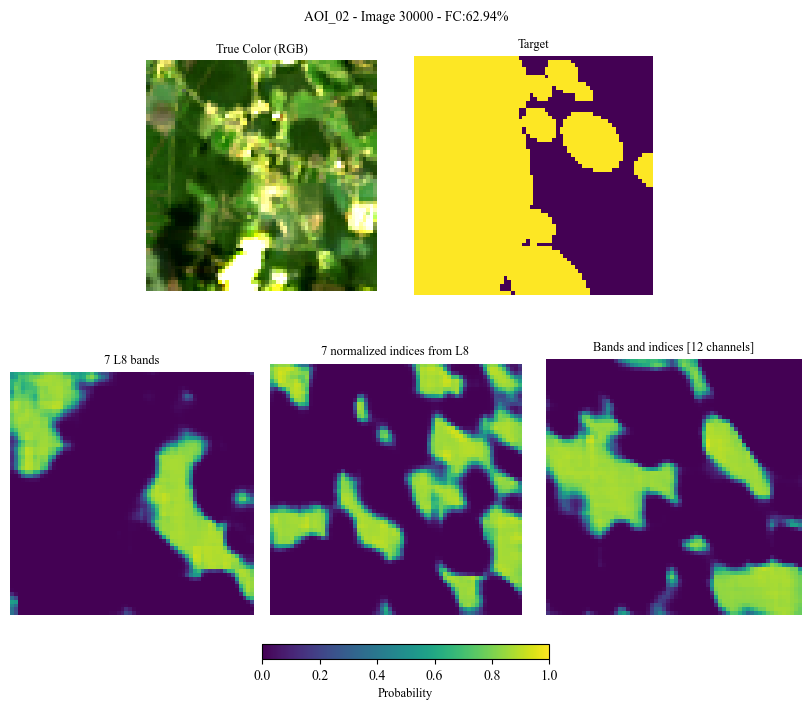

In [ ]:
# Graficar todo como antes pero usando histograma en ax[2]
fig = plt.figure(figsize=(8, 7), layout='constrained')
gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

ax_1 = fig.add_subplot(gs[0, 1:3]) # RGB
ax_2 = fig.add_subplot(gs[0, 3:5]) # Y
ax_3 = fig.add_subplot(gs[1, 0:2]) # Y
ax_4 = fig.add_subplot(gs[1, 2:4]) # Y
ax_5 = fig.add_subplot(gs[1, 4:6]) # Y


ax_1.imshow(normalize(get_rgb(X_)))
ax_1.axis('off')
ax_1.set_title('True Color (RGB)', fontsize=9)

ax_2.imshow(Y_, vmin=0, vmax=1)
ax_2.axis('off')
ax_2.set_title('Target', fontsize=9)

ax_3.imshow(predict_bandas, vmin=0, vmax=1)
ax_3.axis('off')
ax_3.set_title('7 L8 bands', fontsize=9)


im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
ax_4.axis('off')
ax_4.set_title('7 normalized indices from L8', fontsize=9)

im = ax_5.imshow(predict_12ch, vmin=0, vmax=1)
ax_5.axis('off')
ax_5.set_title('Bands and indices [12 channels]', fontsize=9)

cbar = fig.colorbar(im, ax=[ax_3 , ax_4, ax_5],
                    orientation='horizontal',
                    pad=0.1,
                    fraction=0.05,
                    shrink=0.75)
cbar.set_label('Probability', fontsize=9)

plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
#plt.tight_layout()
plt.show()


# Loop A2

In [ ]:
# AOI
AOI_name = 'AOI_02'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_64x64.h5'), 'r')
AOI_[f'{AOI_name}_X'].shape

(94500, 7, 64, 64)

/tmp/ipython-input-3349702990.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_test = torch.tensor(X_test)


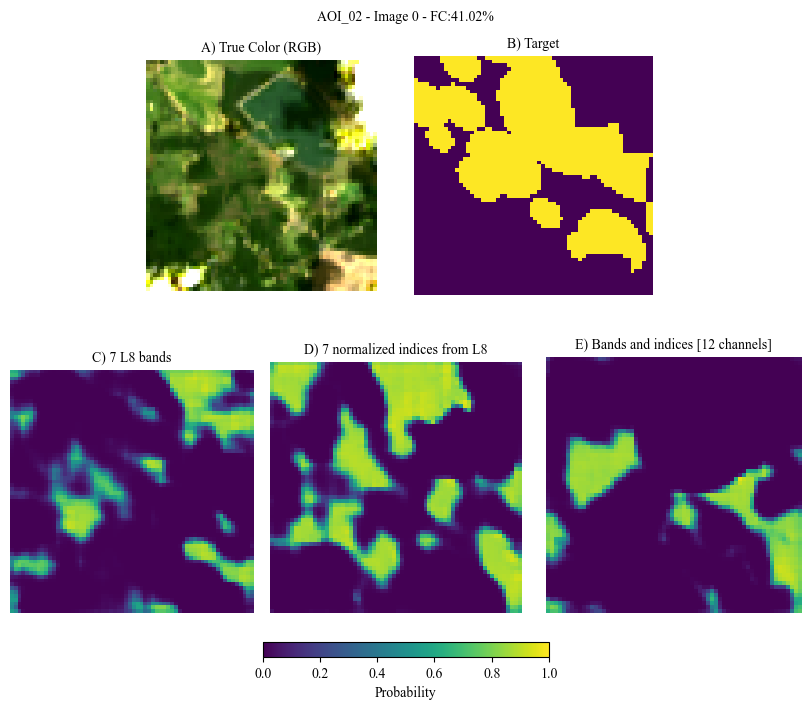

/tmp/ipython-input-2518072461.py:2: RuntimeWarning: invalid value encountered in divide
  x = (B2 - B1) / (B2 + B1)


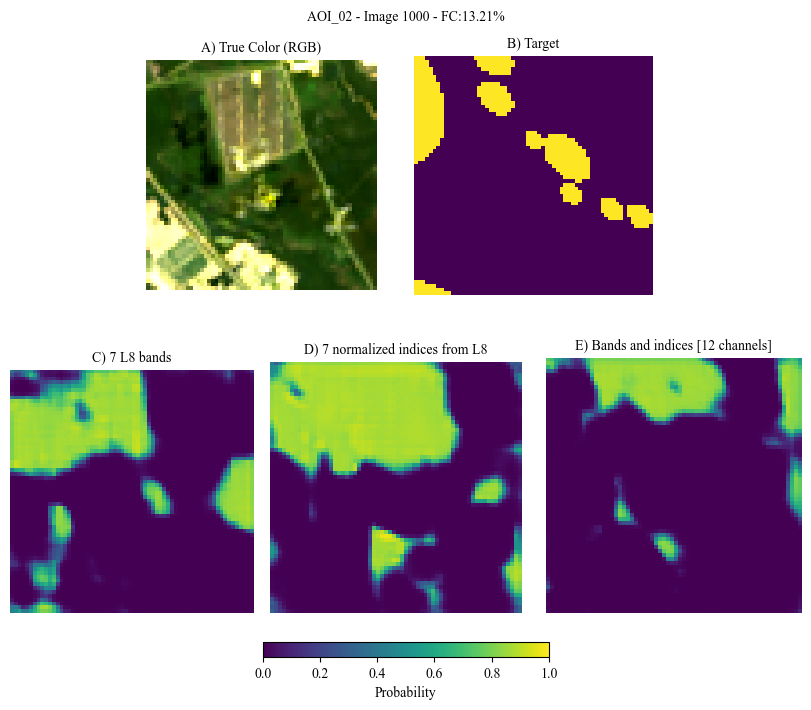

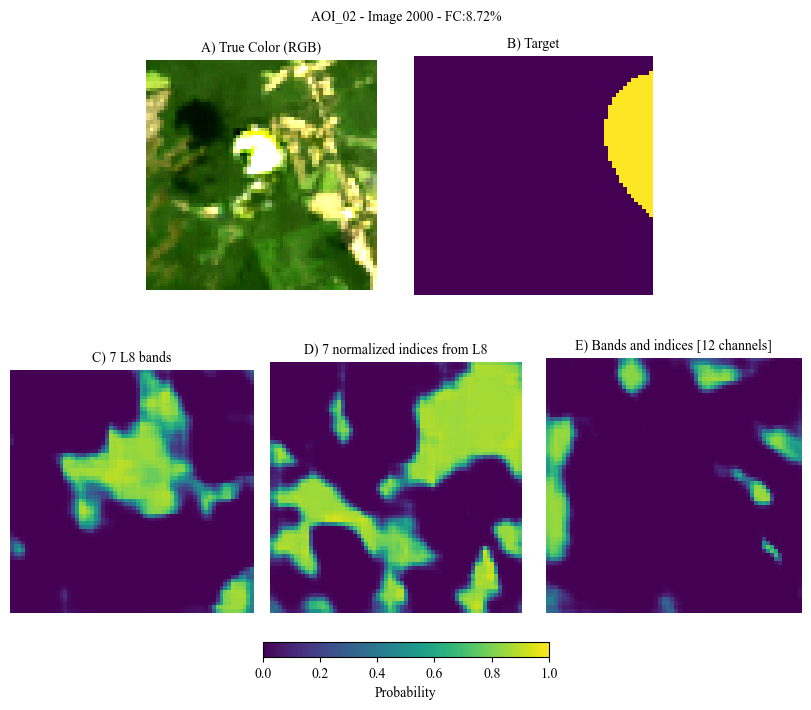

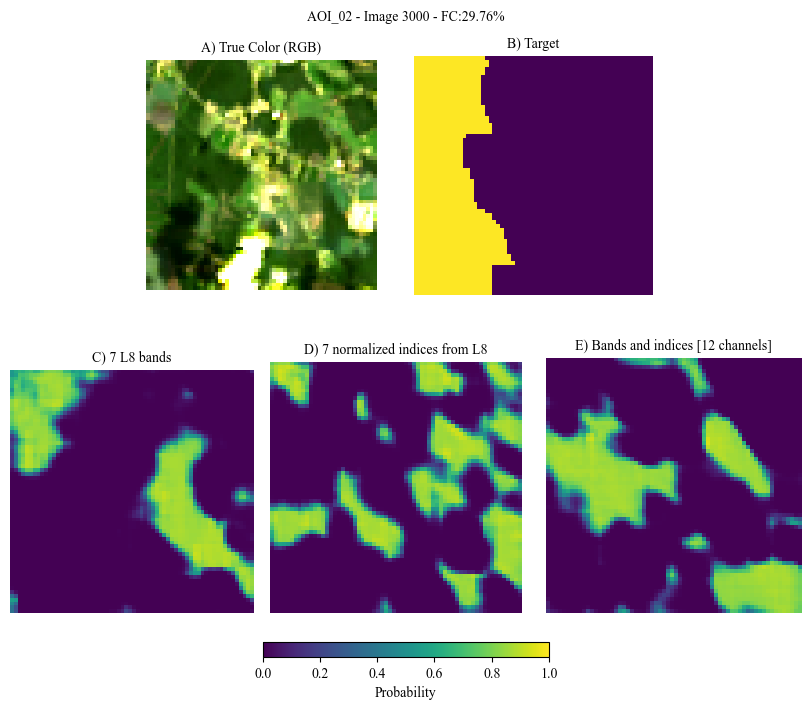

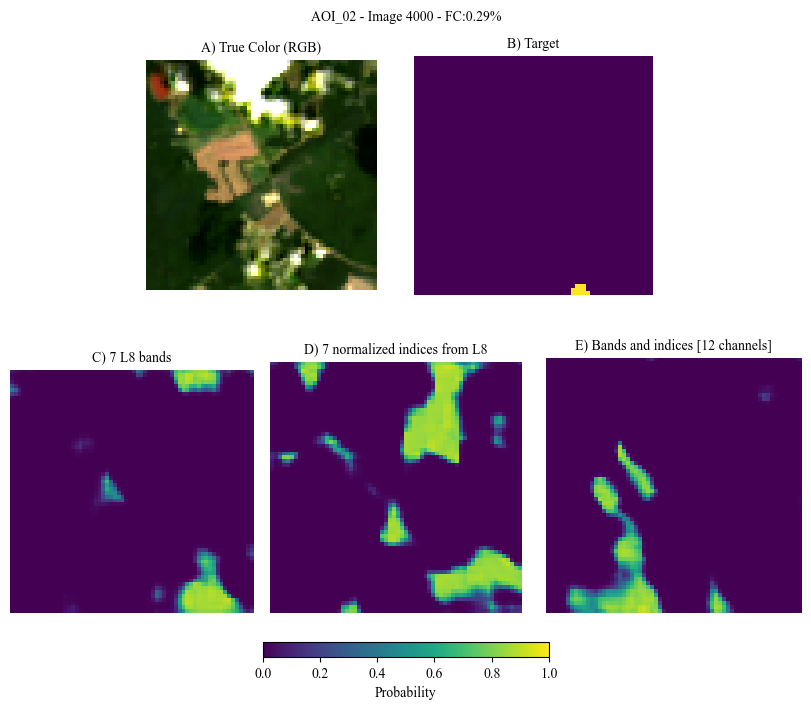

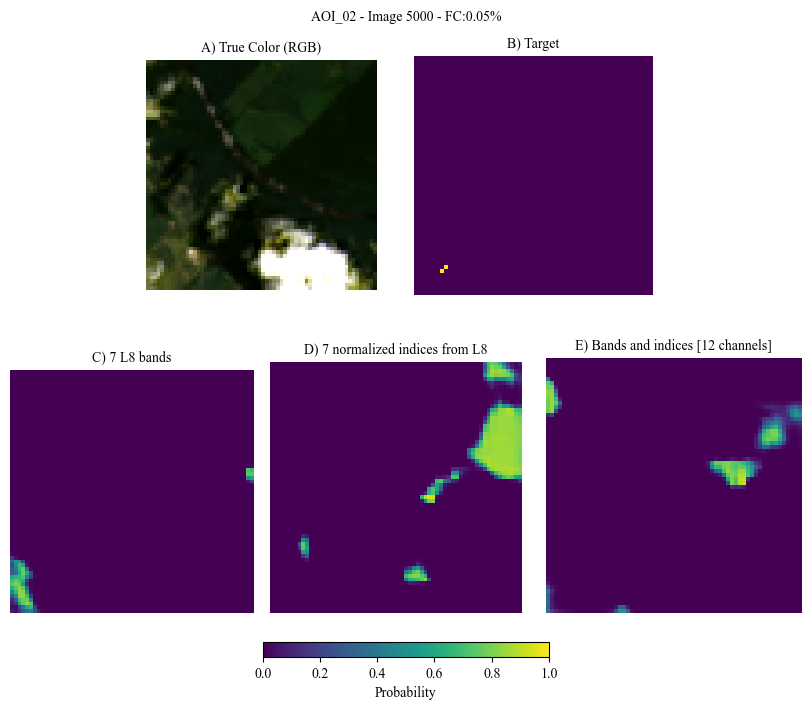

...

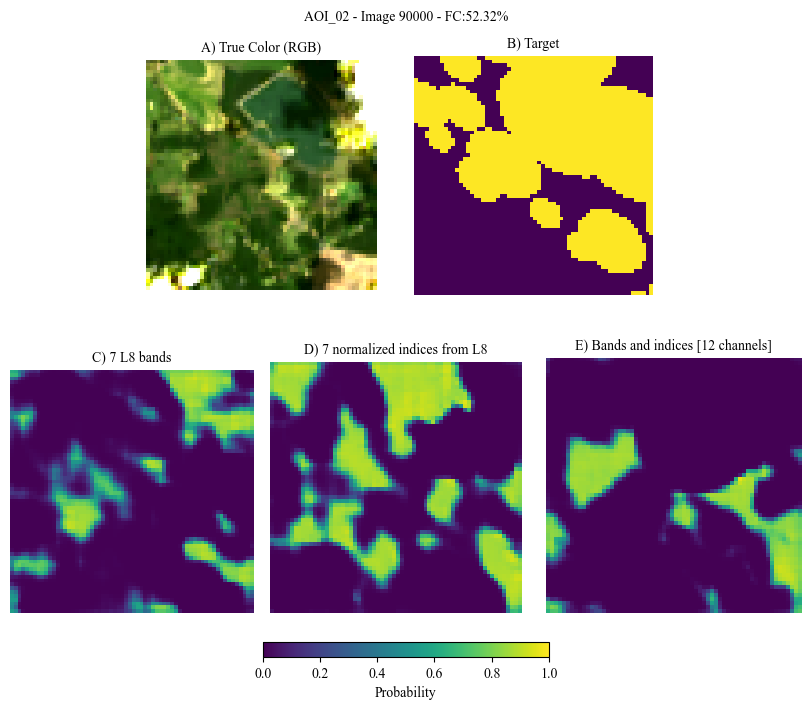

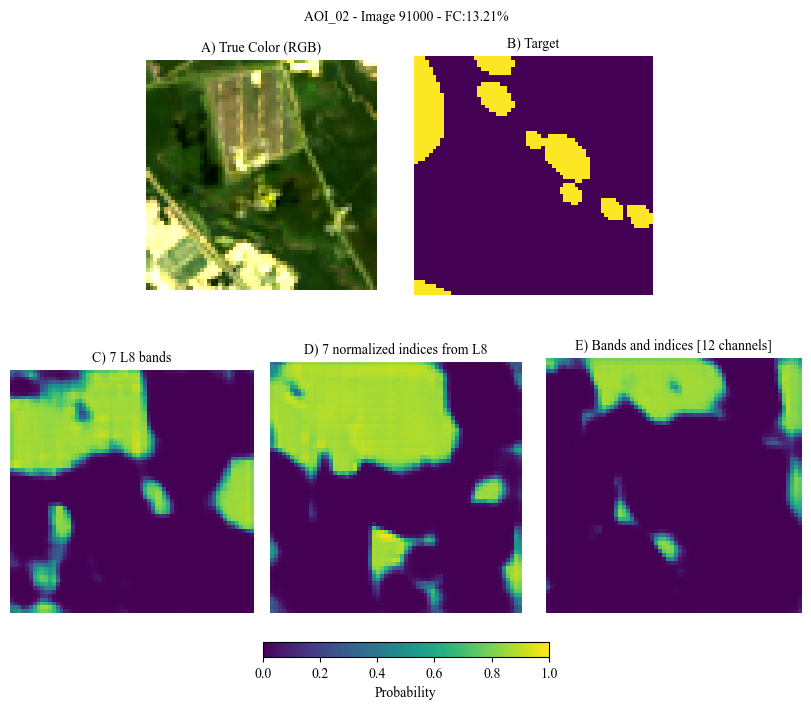

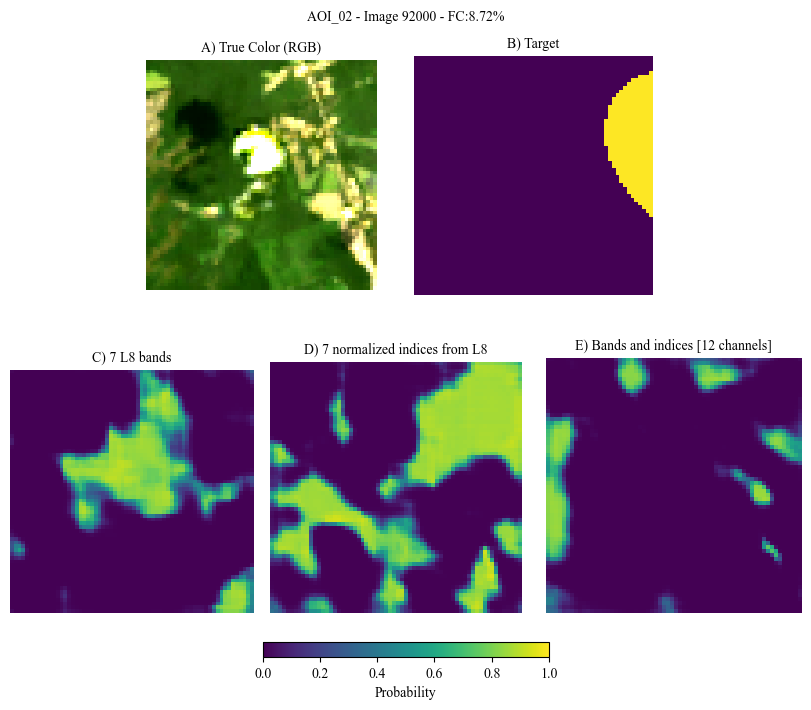

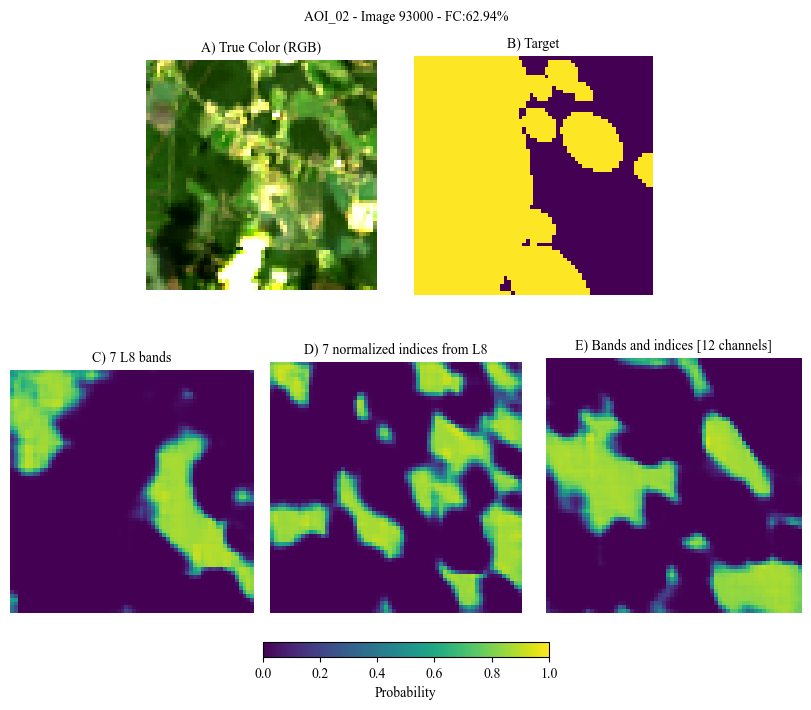

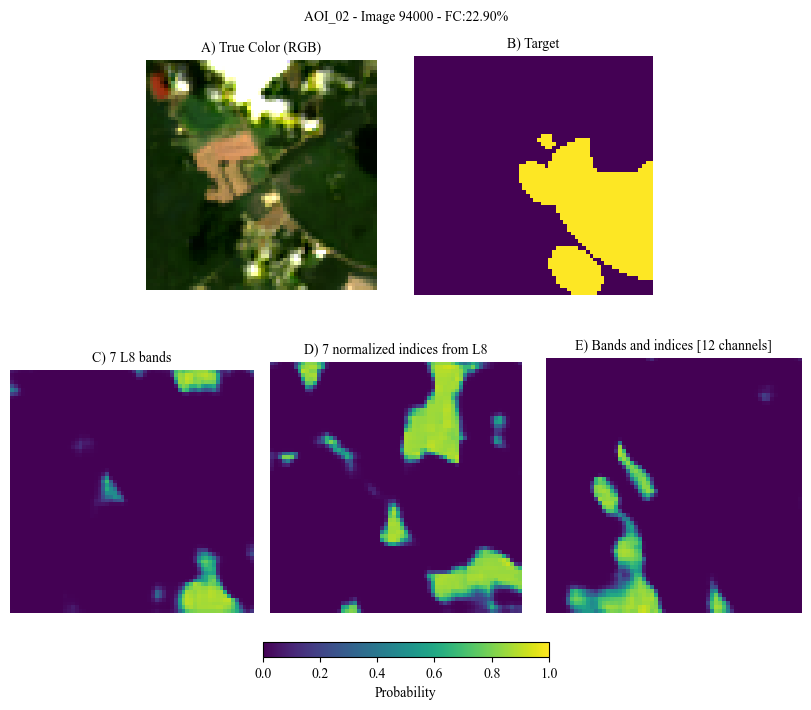

In [ ]:
imgs_of_interests = np.arange(0, AOI_[f'{AOI_name}_X'].shape[0], 1000)

for img in imgs_of_interests:
  X_ = AOI_[f'{AOI_name}_X'][img]
  Y_ = AOI_[f'{AOI_name}_y'][img]
  P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]
  X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
  X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
  X_test = X_test.to(device) # mover a GPU

  predict_bandas = make_predictions(model_bandas, X_test)

  X_test = X_test.cpu()

  # B3 --> axis 2
  # B6 --> axis 5
  # B4_B1 --> axis 7
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

  # B4_B3 --> axis 8
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

  # B7_B3 --> axis 9
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

  # B6_B4 --> axis 10
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

  # B6_B5 --> axis 11
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_12ch = make_predictions(model_12ch, X_test)

  X_test = X_test.cpu()

  # Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
  X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_indices = make_predictions(model_indices, X_test)

  # Graficar todo como antes pero usando histograma en ax[2]
  fig = plt.figure(figsize=(8, 7), layout='constrained')
  gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

  ax_1 = fig.add_subplot(gs[0, 1:3]) # RGB
  ax_2 = fig.add_subplot(gs[0, 3:5]) # Y
  ax_3 = fig.add_subplot(gs[1, 0:2]) # Y
  ax_4 = fig.add_subplot(gs[1, 2:4]) # Y
  ax_5 = fig.add_subplot(gs[1, 4:6]) # Y


  ax_1.imshow(normalize(get_rgb(X_)))
  ax_1.axis('off')
  ax_1.set_title('A) True Color (RGB)', fontsize=10)

  ax_2.imshow(Y_, vmin=0, vmax=1)
  ax_2.axis('off')
  ax_2.set_title('B) Target', fontsize=10)

  ax_3.imshow(predict_bandas, vmin=0, vmax=1)
  ax_3.axis('off')
  ax_3.set_title('C) 7 L8 bands', fontsize=10)


  im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
  ax_4.axis('off')
  ax_4.set_title('D) 7 normalized indices from L8', fontsize=10)

  im = ax_5.imshow(predict_12ch, vmin=0, vmax=1)
  ax_5.axis('off')
  ax_5.set_title('E) Bands and indices [12 channels]', fontsize=10)

  cbar = fig.colorbar(im, ax=[ax_3 , ax_4, ax_5],
                      orientation='horizontal',
                      pad=0.1,
                      fraction=0.05,
                      shrink=0.75)
  cbar.set_label('Probability', fontsize=10)

  plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
  #plt.tight_layout()
  if img == 0:
    plt.savefig((pathSaveFiguras + f'Figura_U-NET_v1_{AOI_name}.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)
  plt.show()

  print('\n')


# Loop A4

In [ ]:
# AOI
AOI_name = 'AOI_04'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_64x64.h5'), 'r')
AOI_[f'{AOI_name}_X'].shape

(94500, 7, 64, 64)

In [ ]:
AOI_['AOI_04_y'][0].sum()

np.float32(0.0)

/tmp/ipython-input-2518072461.py:2: RuntimeWarning: invalid value encountered in divide
  x = (B2 - B1) / (B2 + B1)
/tmp/ipython-input-1617809650.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_test = torch.tensor(X_test)


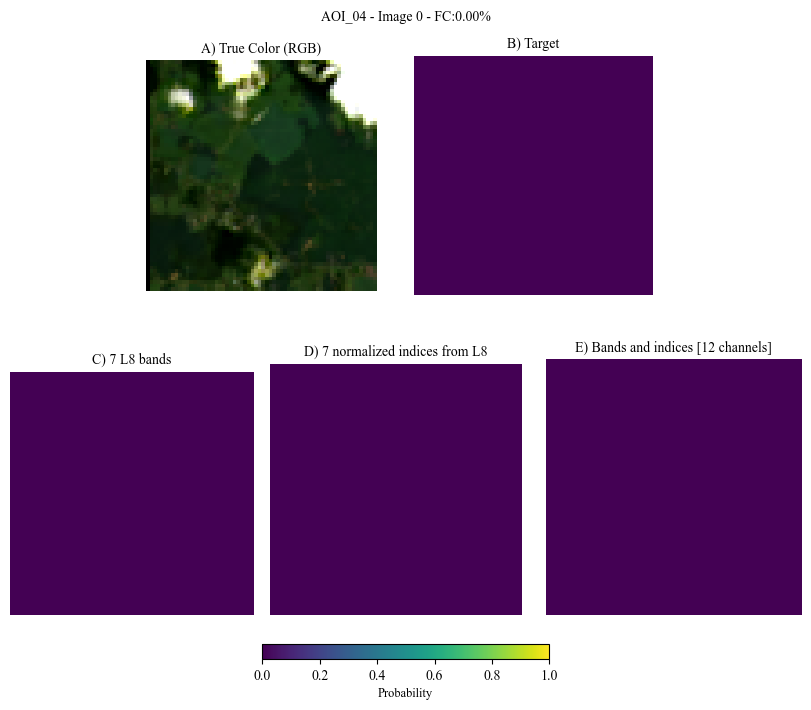

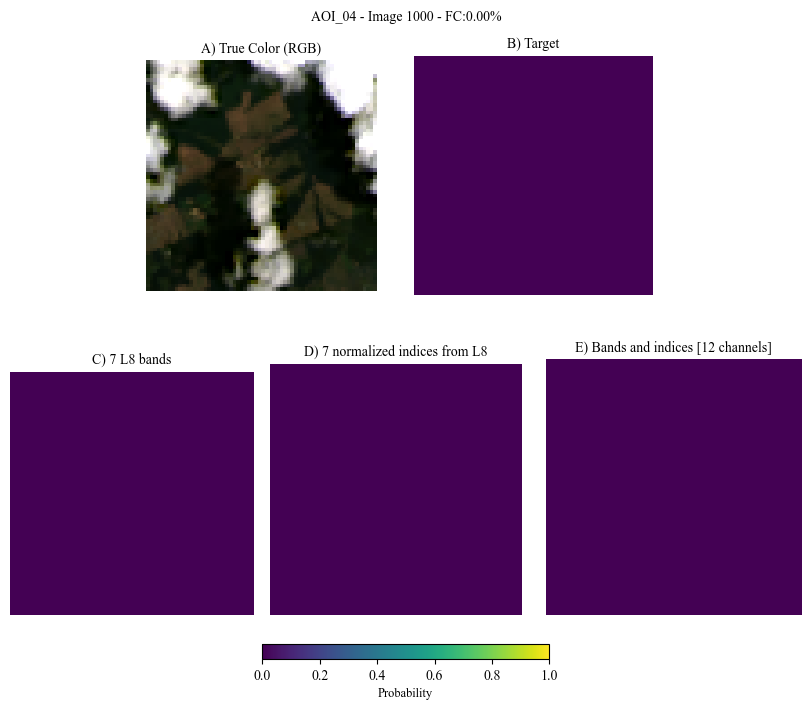

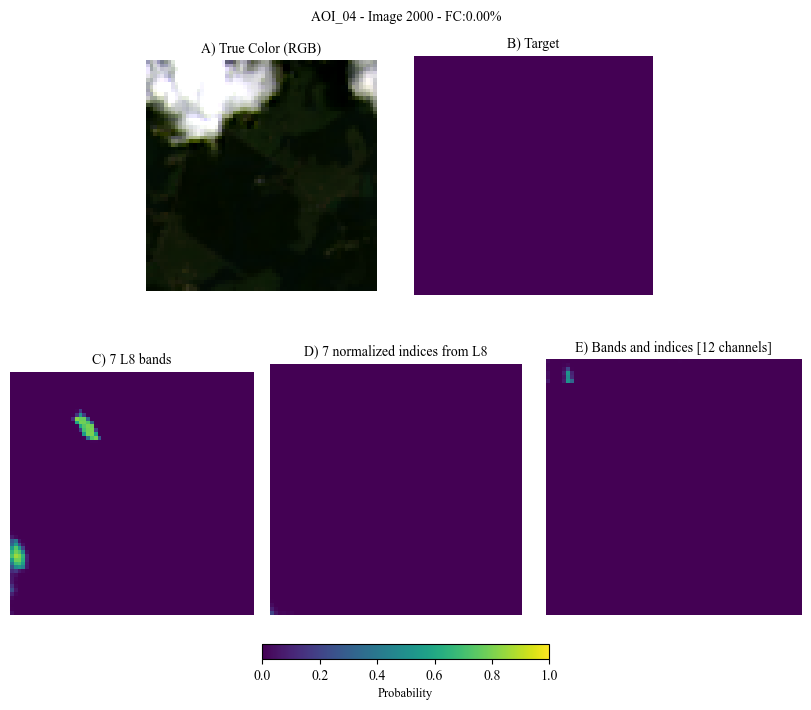

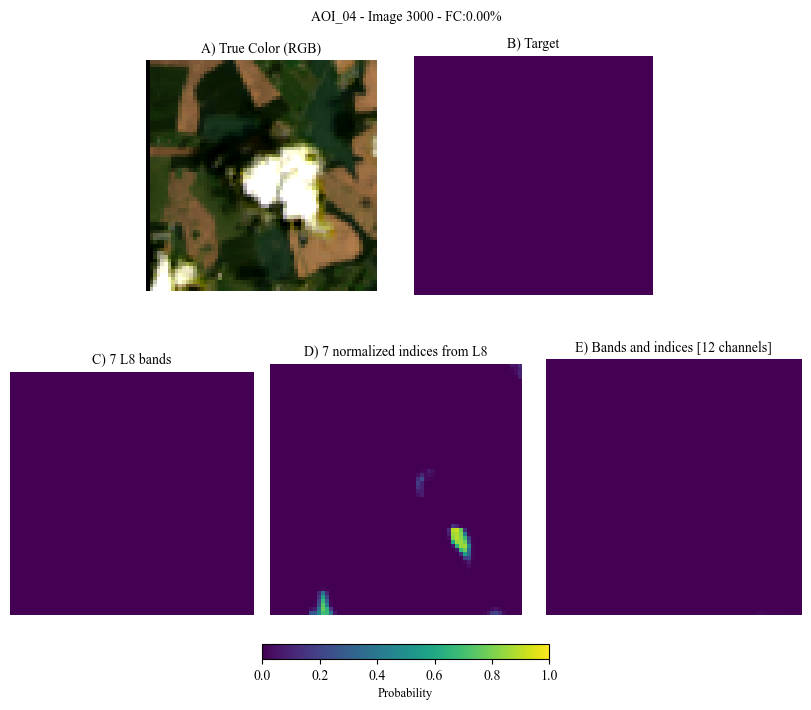

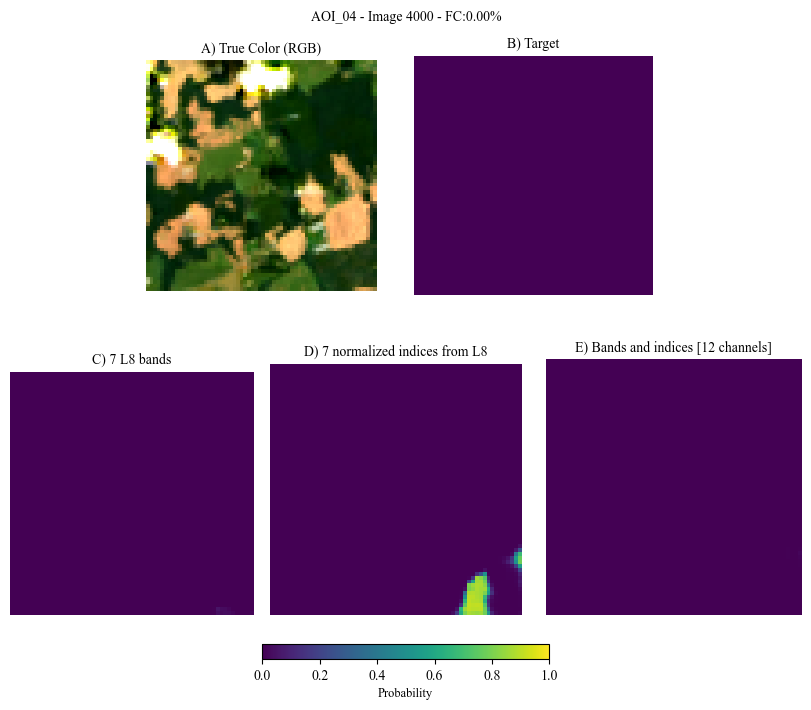

...

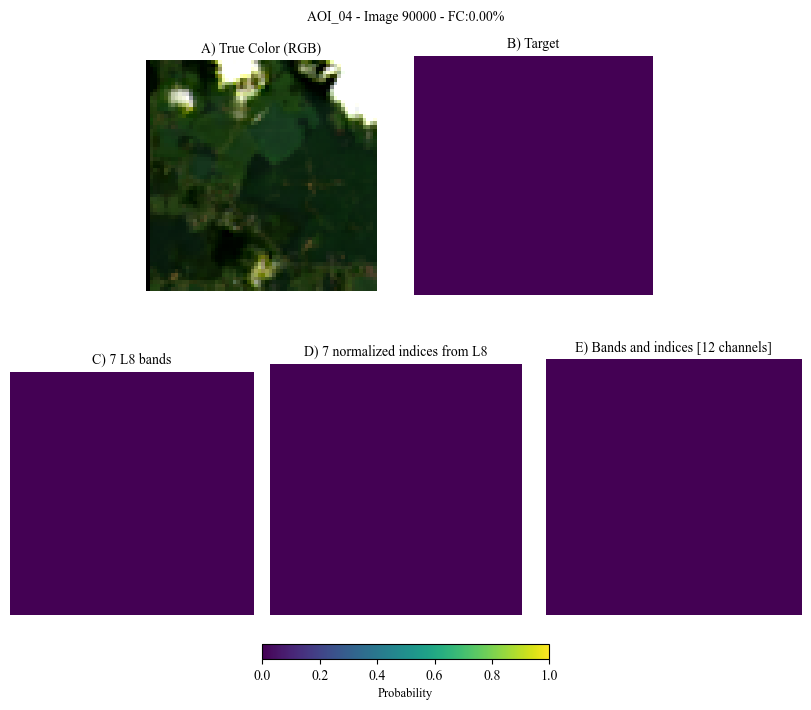

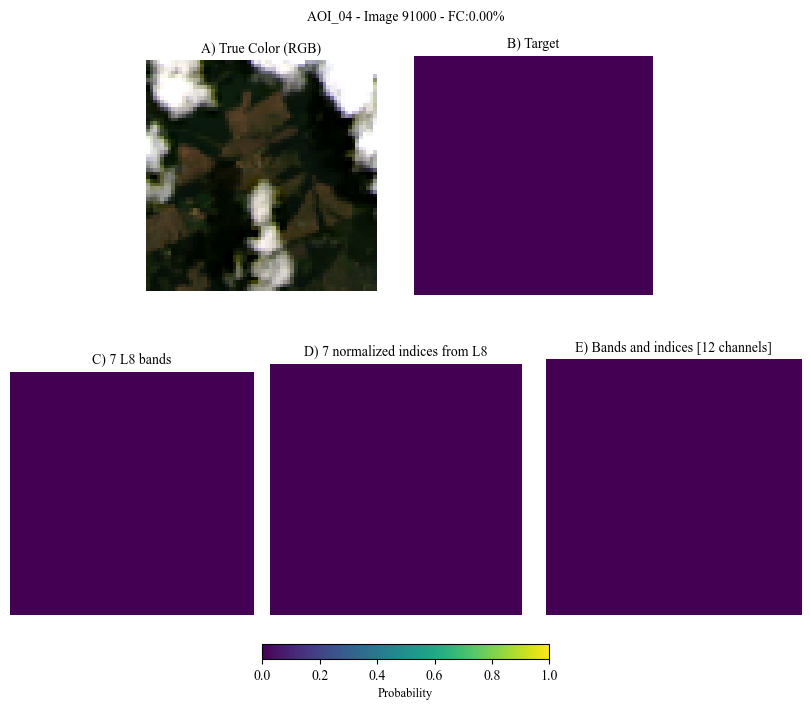

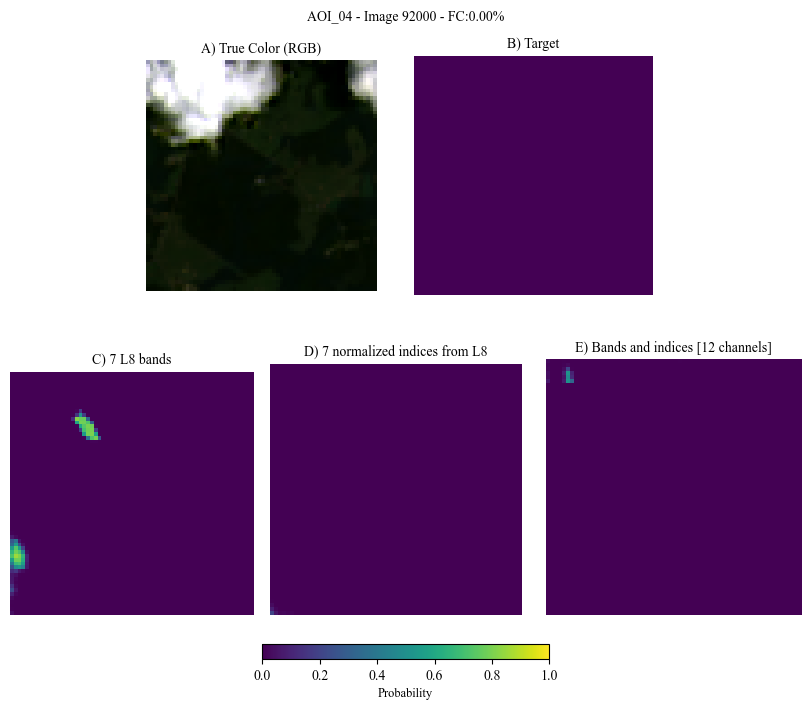

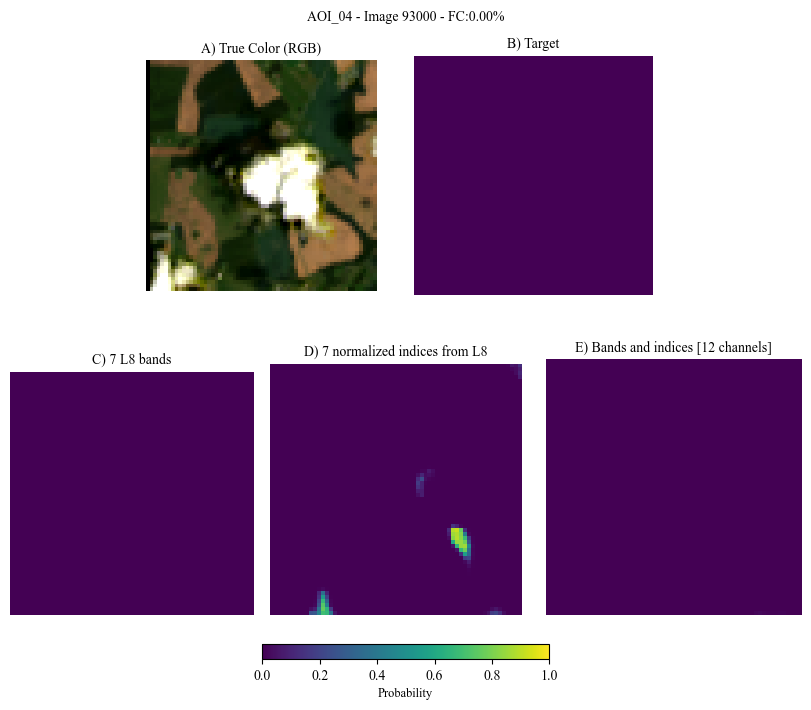

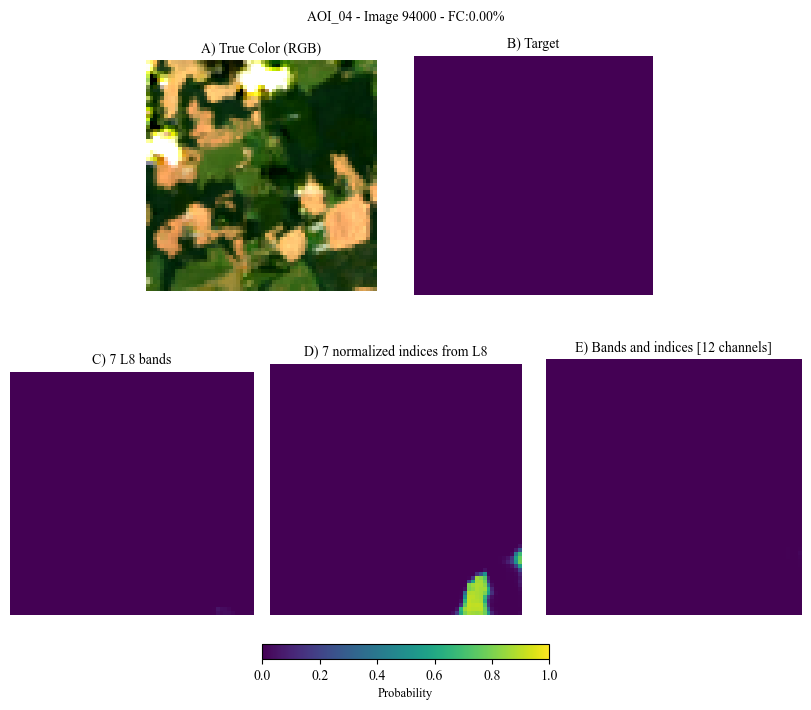

In [ ]:
imgs_of_interests = np.arange(0, AOI_[f'{AOI_name}_X'].shape[0], 1000)

for img in imgs_of_interests:
  X_ = AOI_[f'{AOI_name}_X'][img]
  Y_ = AOI_[f'{AOI_name}_y'][img]
  P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]
  X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
  X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
  X_test = X_test.to(device) # mover a GPU

  predict_bandas = make_predictions(model_bandas, X_test)

  X_test = X_test.cpu()

  # B3 --> axis 2
  # B6 --> axis 5
  # B4_B1 --> axis 7
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

  # B4_B3 --> axis 8
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

  # B7_B3 --> axis 9
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

  # B6_B4 --> axis 10
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

  # B6_B5 --> axis 11
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_12ch = make_predictions(model_12ch, X_test)

  X_test = X_test.cpu()

  # Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
  X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_indices = make_predictions(model_indices, X_test)

  # Graficar todo como antes pero usando histograma en ax[2]
  fig = plt.figure(figsize=(8, 7), layout='constrained')
  gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

  ax_1 = fig.add_subplot(gs[0, 1:3]) # RGB
  ax_2 = fig.add_subplot(gs[0, 3:5]) # Y
  ax_3 = fig.add_subplot(gs[1, 0:2]) # Y
  ax_4 = fig.add_subplot(gs[1, 2:4]) # Y
  ax_5 = fig.add_subplot(gs[1, 4:6]) # Y


  ax_1.imshow(normalize(get_rgb(X_)))
  ax_1.axis('off')
  ax_1.set_title('A) True Color (RGB)', fontsize=10)

  ax_2.imshow(Y_, vmin=0, vmax=1)
  ax_2.axis('off')
  ax_2.set_title('B) Target', fontsize=10)

  ax_3.imshow(predict_bandas, vmin=0, vmax=1)
  ax_3.axis('off')
  ax_3.set_title('C) 7 L8 bands', fontsize=10)


  im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
  ax_4.axis('off')
  ax_4.set_title('D) 7 normalized indices from L8', fontsize=10)

  im = ax_5.imshow(predict_12ch, vmin=0, vmax=1)
  ax_5.axis('off')
  ax_5.set_title('E) Bands and indices [12 channels]', fontsize=10)

  cbar = fig.colorbar(im, ax=[ax_3 , ax_4, ax_5],
                      orientation='horizontal',
                      pad=0.1,
                      fraction=0.05,
                      shrink=0.75)
  cbar.set_label('Probability', fontsize=9)

  plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
  #plt.tight_layout()
  if img == 8000:
    plt.savefig((pathSaveFiguras + f'Figura_U-NET_v1_{AOI_name}.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)

  plt.show()

  print('\n')


# End